In [ ]:
!nvidia-smi

In [ ]:
# !pip install ultralytics

In [1]:
from ultralytics import YOLO

model = YOLO("yolo11n.pt")

In [2]:
import random, numpy as np
from PIL import Image
from glob import glob
from matplotlib import pyplot as plt
from torchvision import transforms as T
import os
import yaml
import random
import cv2
import matplotlib.pyplot as plt

In [ ]:
# pip install wandb

In [ ]:
# import wandb
# wandb.login(key="691f7f627317cf78520e137b1d29e92c725938aa")

In [3]:
def debug_directory(root):
    print(f"1. Checking if root exists: {os.path.exists(root)}")

    # Check YAML file
    yaml_path = os.path.join(root, "military_dataset.yaml")
    print(f"\n2. Checking YAML file:")
    print(f"YAML path exists: {os.path.exists(yaml_path)}")
    if os.path.exists(yaml_path):
        with open(yaml_path, "r") as file:
            data = yaml.safe_load(file)
            print(f"YAML contents (names): {data.get('names', 'No names found')}")

    # Check directories and files
    for data_type in ["train", "val", "test"]:
        print(f"\n3. Checking {data_type} directory:")

        # Check images directory
        image_dir = os.path.join(root, data_type, "images")
        print(f"{data_type}/images exists: {os.path.exists(image_dir)}")
        if os.path.exists(image_dir):
            images = glob(os.path.join(image_dir, "*"))
            print(f"Number of images found: {len(images)}")
            if images:
                print(f"First image path: {images[0]}")

        # Check labels directory
        label_dir = os.path.join(root, data_type, "labels")
        print(f"{data_type}/labels exists: {os.path.exists(label_dir)}")
        if os.path.exists(label_dir):
            labels = glob(os.path.join(label_dir, "*.txt"))
            print(f"Number of labels found: {len(labels)}")
            if labels:
                print(f"First label path: {labels[0]}")
                # Try to read first label file
                try:
                    with open(labels[0], "r") as f:
                        first_line = f.readline().strip()
                        print(f"First line of first label: {first_line}")
                except Exception as e:
                    print(f"Error reading label file: {e}")


# Run debug function
root = r"/home/nic/workspace/Mlops/MHD/military_object_dataset"
debug_directory(root)

1. Checking if root exists: True

2. Checking YAML file:
YAML path exists: True
YAML contents (names): {0: 'camouflage_soldier', 1: 'weapon', 2: 'military_tank', 3: 'military_truck', 4: 'military_vehicle', 5: 'civilian', 6: 'soldier', 7: 'civilian_vehicle', 8: 'military_artillery', 9: 'trench', 10: 'military_aircraft', 11: 'military_warship'}

3. Checking train directory:
train/images exists: True
Number of images found: 21978
First image path: /home/nic/workspace/Mlops/MHD/military_object_dataset/train/images/009197.jpg
train/labels exists: True
Number of labels found: 21978
First label path: /home/nic/workspace/Mlops/MHD/military_object_dataset/train/labels/024121.txt
First line of first label: 11 0.503125 0.51015625 0.99375 0.9234375

3. Checking val directory:
val/images exists: True
Number of images found: 2941
First image path: /home/nic/workspace/Mlops/MHD/military_object_dataset/val/images/011414.jpg
val/labels exists: True
Number of labels found: 2941
First label path: /home/n

Initialized with root path: /home/nic/workspace/Mlops/MHD/military_object_dataset
Reading YAML from: /home/nic/workspace/Mlops/MHD/military_object_dataset/military_dataset.yaml
Loaded class dictionary: {0: 0, 1: 1, 2: 2, 3: 3, 4: 4, 5: 5, 6: 6, 7: 7, 8: 8, 9: 9, 10: 10, 11: 11}

Processing train dataset
Looking for images in: /home/nic/workspace/Mlops/MHD/military_object_dataset/train/images
Found 21978 images
Processed 21978 valid image-label pairs
Class distribution: {7: 519, 3: 1245, 4: 1963, 10: 7337, 2: 17454, 6: 6502, 11: 2134, 0: 4477, 1: 1210, 8: 439, 5: 52, 9: 4}

Processing val dataset
Looking for images in: /home/nic/workspace/Mlops/MHD/military_object_dataset/val/images
Found 2941 images
Processed 2941 valid image-label pairs
Class distribution: {8: 117, 10: 1063, 2: 1787, 0: 510, 6: 745, 1: 358, 3: 148, 4: 307, 7: 42, 9: 3, 5: 1}

Processing test dataset
Looking for images in: /home/nic/workspace/Mlops/MHD/military_object_dataset/test/images
Found 1396 images
Error process

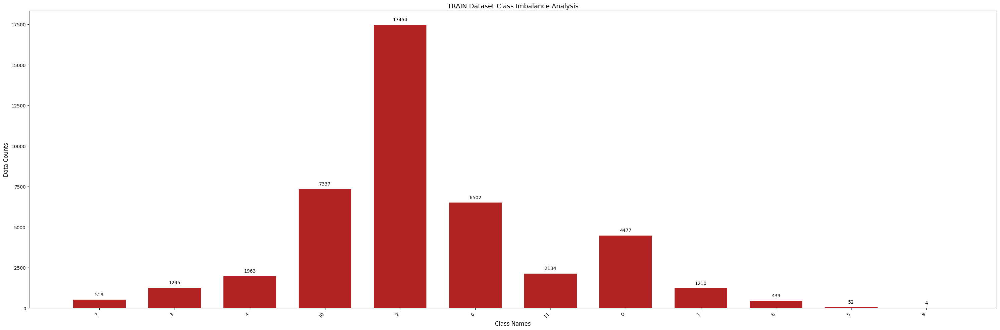


Data analysis for val...


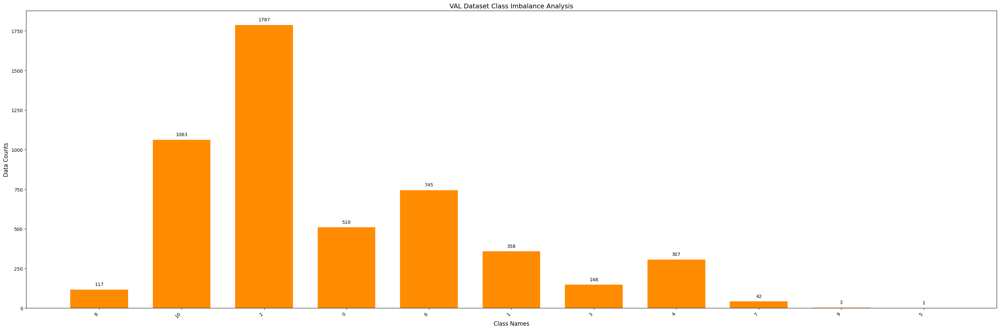


Data analysis for test...


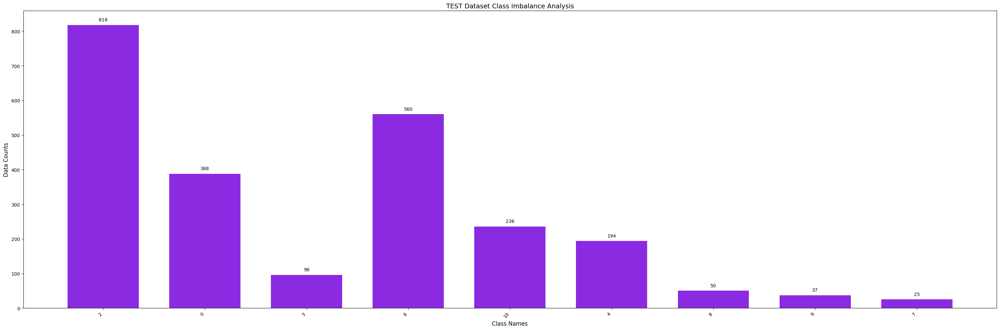

In [4]:
class Visualization:
    def __init__(self, root, data_types, n_ims, rows, cmap=None):
        self.n_ims = n_ims
        self.rows = rows
        self.cmap = cmap
        self.data_types = data_types
        self.colors = ["firebrick", "darkorange", "blueviolet"]

        # Convert backslashes to forward slashes for consistency
        self.root = os.path.normpath(root)
        print(f"Initialized with root path: {self.root}")
        self.get_cls_names()
        self.get_bboxes()

    def get_cls_names(self):
        yaml_path = os.path.join(self.root, "military_dataset.yaml")
        print(f"Reading YAML from: {yaml_path}")

        with open(yaml_path, "r") as file:
            data = yaml.safe_load(file)

        # Extract class names
        self.class_dict = {index: name for index, name in enumerate(data["names"])}
        print(f"Loaded class dictionary: {self.class_dict}")

    def get_bboxes(self):
        self.vis_datas = {}
        self.analysis_datas = {}
        self.im_paths = {}

        for data_type in self.data_types:
            print(f"\nProcessing {data_type} dataset")
            all_bboxes = []
            all_analysis_datas = {}

            image_dir = os.path.join(self.root, data_type, "images")
            print(f"Looking for images in: {image_dir}")

            im_paths = glob(os.path.join(image_dir, "*"))
            print(f"Found {len(im_paths)} images")

            for idx, im_path in enumerate(im_paths):
                # Get corresponding label path
                base_name = os.path.basename(im_path)
                name_without_ext = os.path.splitext(base_name)[0]
                lbl_path = os.path.join(
                    self.root, data_type, "labels", f"{name_without_ext}.txt"
                )

                if not os.path.isfile(lbl_path):
                    print(f"Warning: No label file for {im_path}")
                    continue

                bboxes = []
                with open(lbl_path, "r") as f:
                    for line in f:
                        parts = line.strip().split()
                        if len(parts) >= 5:  # Ensure we have class + 4 bbox coordinates
                            try:
                                class_idx = int(parts[0])
                                cls_name = self.class_dict[class_idx]
                                bbox = [cls_name] + [float(x) for x in parts[1:5]]
                                bboxes.append(bbox)

                                # Update analysis data
                                if cls_name not in all_analysis_datas:
                                    all_analysis_datas[cls_name] = 1
                                else:
                                    all_analysis_datas[cls_name] += 1

                            except (ValueError, IndexError, KeyError) as e:
                                print(f"Error processing line in {lbl_path}: {e}")
                                continue

                all_bboxes.append(bboxes)

            print(f"Processed {len(all_bboxes)} valid image-label pairs")
            print(f"Class distribution: {all_analysis_datas}")

            self.vis_datas[data_type] = all_bboxes
            self.analysis_datas[data_type] = all_analysis_datas
            self.im_paths[data_type] = im_paths

    def plot(self, rows, cols, count, im_path, bboxes):
        plt.subplot(rows, cols, count)

        try:
            or_im = np.array(Image.open(im_path).convert("RGB"))
            height, width, _ = or_im.shape

            for bbox in bboxes:
                class_id, x_center, y_center, w, h = bbox

                # Convert YOLO format to pixel values
                x_min = int((x_center - w / 2) * width)
                y_min = int((y_center - h / 2) * height)
                x_max = int((x_center + w / 2) * width)
                y_max = int((y_center + h / 2) * height)

                color = (
                    random.randint(0, 255),
                    random.randint(0, 255),
                    random.randint(0, 255),
                )
                cv2.rectangle(
                    img=or_im,
                    pt1=(x_min, y_min),
                    pt2=(x_max, y_max),
                    color=color,
                    thickness=3,
                )

            plt.imshow(or_im)
            plt.axis("off")
            plt.title(f"There is (are) {len(bboxes)} object(s) in the image.")

        except Exception as e:
            print(f"Error plotting image {im_path}: {e}")

        return count + 1

    def vis(self, save_name):
        print(f"\n{save_name.upper()} Data Visualization is in process...")

        if not self.vis_datas.get(save_name):
            print(f"No data found for {save_name}")
            return

        cols = max(1, self.n_ims // self.rows)
        count = 1

        plt.figure(figsize=(25, 20))

        data_len = len(self.vis_datas[save_name])
        indices = [
            random.randint(0, data_len - 1) for _ in range(min(self.n_ims, data_len))
        ]

        for idx, index in enumerate(indices):
            if count == self.n_ims + 1:
                break

            im_path = self.im_paths[save_name][index]
            bboxes = self.vis_datas[save_name][index]

            count = self.plot(self.rows, cols, count, im_path=im_path, bboxes=bboxes)

        plt.tight_layout()
        plt.show()

    def data_analysis(self, save_name, color):
        print(f"\nData analysis for {save_name}...")

        if not self.analysis_datas.get(save_name):
            print(f"No analysis data for {save_name}")
            return

        cls_names = list(self.analysis_datas[save_name].keys())
        counts = list(self.analysis_datas[save_name].values())

        if not cls_names or not counts:
            print(f"No classes or counts found for {save_name}")
            return

        fig, ax = plt.subplots(figsize=(30, 10))
        width = 0.7
        indices = np.arange(len(counts))

        ax.bar(indices, counts, width, color=color)
        ax.set_xlabel("Class Names", color="black", fontsize=12)
        ax.set_ylabel("Data Counts", color="black", fontsize=12)
        ax.set_title(
            f"{save_name.upper()} Dataset Class Imbalance Analysis", fontsize=14
        )

        ax.set_xticks(indices)
        ax.set_xticklabels(cls_names, rotation=45, ha="right")

        # Add value labels on top of bars
        for i, v in enumerate(counts):
            ax.text(i, v + max(counts) * 0.01, str(v), ha="center", va="bottom")

        plt.tight_layout()
        plt.show()

    def visualization(self):
        for save_name in self.data_types:
            self.vis(save_name)

    def analysis(self):
        for save_name, color in zip(self.data_types, self.colors):
            self.data_analysis(save_name, color)


# Usage
# root = "/kaggle/input/military-assets-dataset-12-classes-yolo8-format/military_object_dataset"  # Use forward slashes
vis = Visualization(
    root=root, data_types=["train", "val", "test"], n_ims=20, rows=5, cmap="rgb"
)
vis.analysis()


TRAIN Data Visualization is in process...


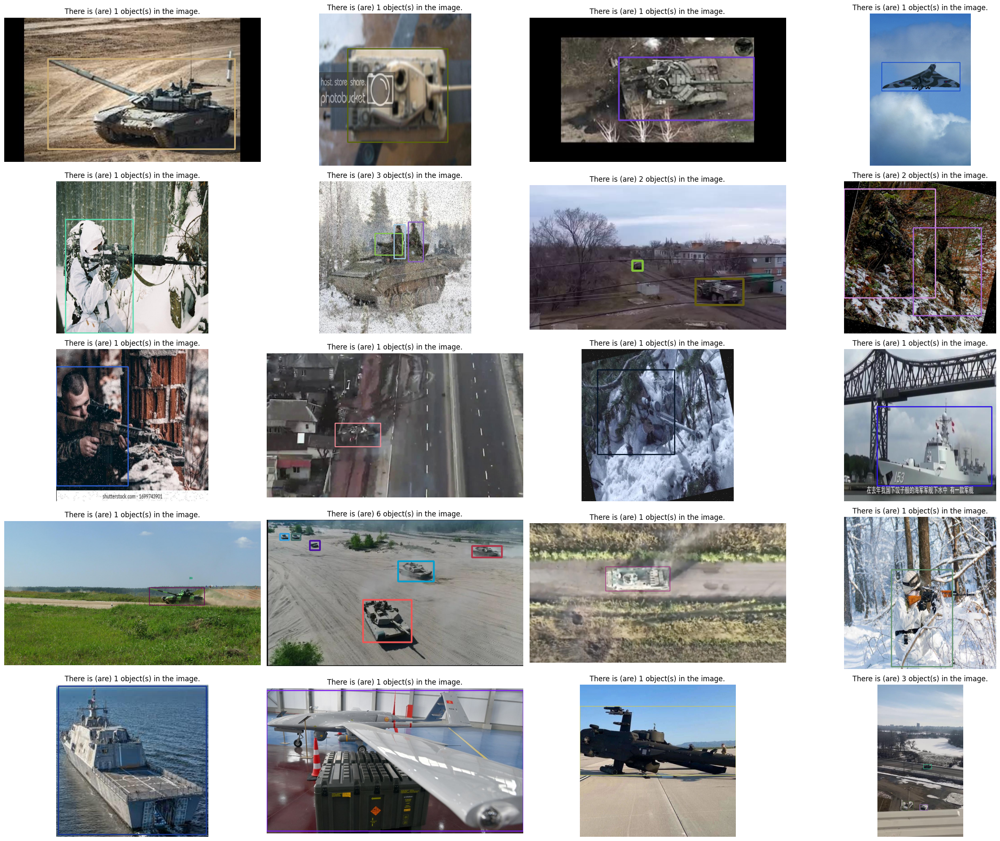


VAL Data Visualization is in process...


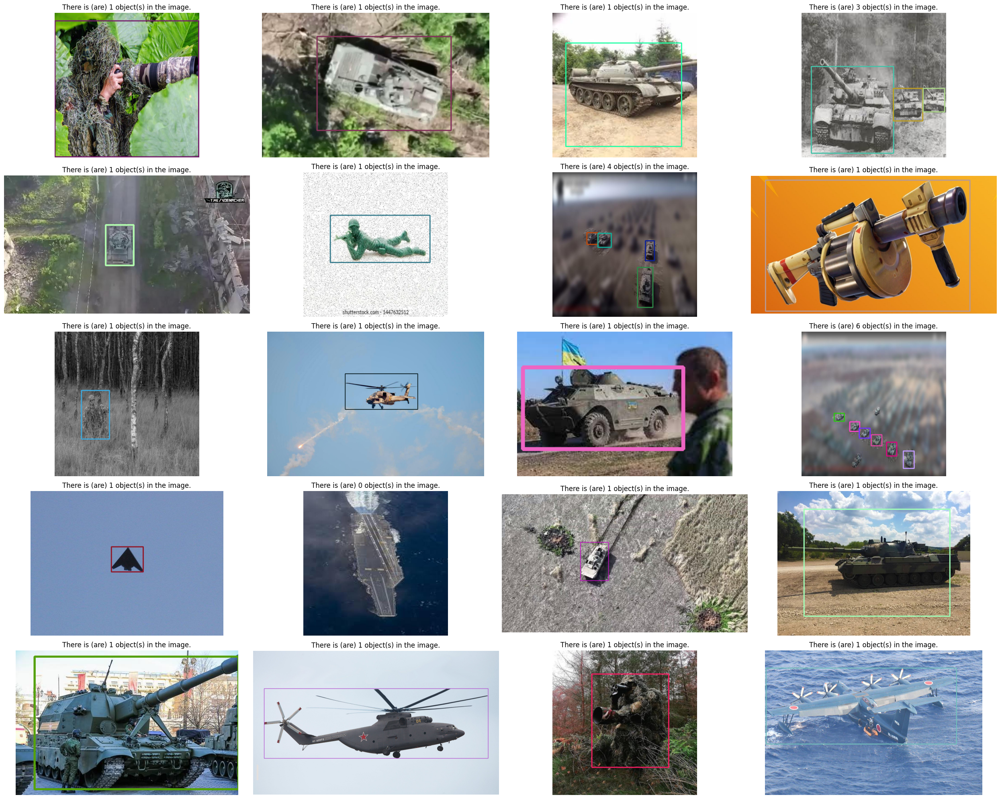


TEST Data Visualization is in process...


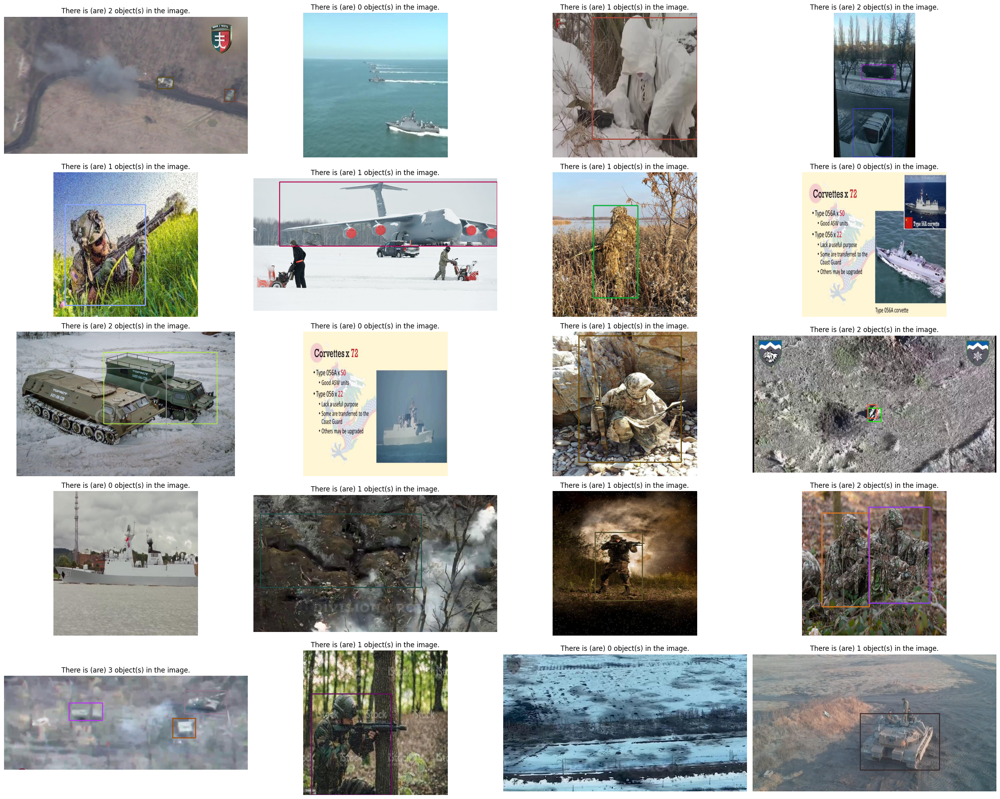

In [5]:
vis.visualization()

In [6]:
import torch
print(f"CUDA available: {torch.cuda.is_available()}")
print(f"CUDA version: {torch.version.cuda}")

CUDA available: True
CUDA version: 12.4


In [7]:
import torch
print(torch.__version__)

2.5.1+cu124


In [8]:
import yaml
import wandb
import mlflow
from mlflow import log_params, log_metric
from datetime import datetime
from ultralytics import YOLO  # Ensure you're importing the YOLO model

# Define root directory (update as per your file structure)
root = "/home/nic/workspace/Mlops/MHD/military_object_dataset"

# Load YAML content into a Python dictionary
yml_file_path = f"{root}/military_dataset.yaml"

with open(yml_file_path, "r") as file:
    data = yaml.safe_load(file)

# Update the paths
data["train"] = f"{root}/train/images"
data["val"] = f"{root}/val/images"
data["test"] = f"{root}/test/images"

print("Updated YAML Config:", data)

# Save the updated YAML content to a file
output_path = "updated_config_1.yml"
with open(output_path, "w") as file:
    yaml.dump(data, file, default_flow_style=False)

# Initialize W&B project
wandb.init(project="yolo-training", config={
    "epochs": 30,
    "imgsz": 480,
    "batch": 16,
    "workers": 8
})

# Start MLflow experiment
mlflow.set_tracking_uri("http://192.168.29.161:8087")  # Your MLflow tracking URI
experiment_name = "YOLO Training for 12 assets"
mlflow.set_experiment(experiment_name)

# Initialize the YOLO model
model = YOLO("yolov8n.pt")  # Replace with the correct YOLO version and weights

with mlflow.start_run(run_name=f"YOLO_Run_{datetime.now().strftime('%Y%m%d_%H%M%S')}"):
    # Log parameters to MLflow
    mlflow.log_param("epochs", 30)
    mlflow.log_param("imgsz", 480)
    mlflow.log_param("batch", 16)
    mlflow.log_param("workers", 8)
    mlflow.log_param("data", "updated_config_1.yml")

    # Start training
    train_results = model.train(
        data="updated_config.yml",
        epochs=30,
        imgsz=480,
        device=[0],
        batch=16,
        workers=8,
    )

    # Log metrics to W&B and MLflow
    # Using the correct attribute from the train_results
    metrics = train_results.box.map  # Access the mAP metric
    print("Training metrics:", metrics)

    if isinstance(metrics, dict):
        for key, value in metrics.items():
            if isinstance(value, (int, float)):
                wandb.log({key: value})
                mlflow.log_metric(key, value)

    # Save the model artifacts
    mlflow.log_artifacts("runs")  # Assuming 'runs' is the directory where YOLO saves results

# Finish W&B run
wandb.finish()

Updated YAML Config: {'path': 'military_object_dataset', 'test': '/home/nic/workspace/Mlops/MHD/military_object_dataset/test/images', 'train': '/home/nic/workspace/Mlops/MHD/military_object_dataset/train/images', 'val': '/home/nic/workspace/Mlops/MHD/military_object_dataset/val/images', 'names': {0: 'camouflage_soldier', 1: 'weapon', 2: 'military_tank', 3: 'military_truck', 4: 'military_vehicle', 5: 'civilian', 6: 'soldier', 7: 'civilian_vehicle', 8: 'military_artillery', 9: 'trench', 10: 'military_aircraft', 11: 'military_warship'}}


wandb: Currently logged in as: amishra527. Use `wandb login --relogin` to force relogin
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.


New https://pypi.org/project/ultralytics/8.3.67 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.59 🚀 Python-3.9.21 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=updated_config.yml, epochs=30, time=None, patience=100, batch=16, imgsz=480, save=True, save_period=-1, cache=False, device=[0], workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=Fal

train: Scanning /home/nic/workspace/Mlops/MHD/KIIT-MiTA/train/labels.cache... 1360 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1360/1360 [00:00<?, ?it/s]Scanning /home/nic/workspace/Mlops/MHD/KIIT-MiTA/train/labels.cache... 1360 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1360/1360 [00:00<?, ?it/s]
val: Scanning /home/nic/workspace/Mlops/MHD/KIIT-MiTA/valid/labels.cache... 170 images, 0 backgrounds, 0 corrupt: 100%|██████████| 170/170 [00:00<?, ?it/s]Scanning /home/nic/workspace/Mlops/MHD/KIIT-MiTA/valid/labels.cache... 170 images, 0 backgrounds, 0 corrupt: 100%|██████████| 170/170 [00:00<?, ?it/s]


Plotting labels to runs/detect/train4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
MLflow: logging run_id(242af378db20444a98c7b06bf08fa104) to http://192.168.29.161:8087
MLflow: disable with 'yolo settings mlflow=False'
MLflow: WARNING ⚠️ Failed to initialize: API request to http://192.168.29.161:8087/api/2.0/mlflow/runs/log-batch failed with exception HTTPConnectionPool(host='192.168.29.161', port=8087): Max retries exceeded with url: /api/2.0/mlflow/runs/log-batch (Caused by ResponseError('too many 500 error responses'))
MLflow: WARNING ⚠️ Not tracking this run
Image sizes 480 train, 480 val
Using 8 dataloader workers
Logging results to runs/detect/train4
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   

       1/30      1.24G      1.403      3.137      1.271         85        480: 100%|██████████| 85/85 [00:14<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [-1:59:59<00:00, -4.60it/s]


                   all        170        456      0.443      0.194      0.207      0.122

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      1.23G      1.407      2.332      1.291         80        480: 100%|██████████| 85/85 [00:09<00:00,  8.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.80it/s]


                   all        170        456      0.338      0.332      0.271      0.151

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      1.22G      1.421      2.199      1.292         71        480: 100%|██████████| 85/85 [00:08<00:00,  9.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.57it/s]


                   all        170        456      0.294      0.356      0.267       0.14

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      1.24G       1.42      2.158      1.314         69        480: 100%|██████████| 85/85 [00:06<00:00, 14.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  8.14it/s]


                   all        170        456       0.41      0.434      0.318      0.166

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      1.24G      1.403      2.008      1.302         73        480: 100%|██████████| 85/85 [00:08<00:00, 10.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.56it/s]


                   all        170        456      0.424      0.411       0.41      0.225

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      1.25G      1.359      1.908      1.262         86        480: 100%|██████████| 85/85 [00:09<00:00,  9.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.62it/s]


                   all        170        456      0.394      0.407      0.357      0.207

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      1.26G      1.334      1.834      1.239         78        480: 100%|██████████| 85/85 [00:06<00:00, 13.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  8.08it/s]


                   all        170        456      0.421      0.499      0.443      0.256

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      1.24G      1.301      1.724      1.225         72        480: 100%|██████████| 85/85 [00:09<00:00,  9.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.90it/s]


                   all        170        456       0.48      0.438      0.426      0.256

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      1.21G      1.301      1.656      1.218         96        480: 100%|██████████| 85/85 [00:08<00:00, 10.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  8.25it/s]


                   all        170        456      0.462      0.452      0.434      0.261

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      1.23G      1.298       1.64      1.225         74        480: 100%|██████████| 85/85 [00:08<00:00,  9.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.99it/s]


                   all        170        456      0.587      0.471       0.52      0.316

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      1.24G      1.244      1.532      1.186         92        480: 100%|██████████| 85/85 [00:09<00:00,  8.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.45it/s]


                   all        170        456      0.528      0.506       0.51      0.317

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      1.25G      1.255      1.551      1.202         87        480: 100%|██████████| 85/85 [00:09<00:00,  9.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.50it/s]


                   all        170        456       0.55      0.448       0.49        0.3

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      1.24G      1.226      1.472      1.176         95        480: 100%|██████████| 85/85 [00:09<00:00,  8.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.43it/s]


                   all        170        456       0.65      0.475      0.535       0.32

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      1.24G      1.228      1.448      1.185         73        480: 100%|██████████| 85/85 [00:09<00:00,  9.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.85it/s]


                   all        170        456        0.5      0.574      0.536      0.324

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      1.26G      1.191      1.407      1.163         81        480: 100%|██████████| 85/85 [00:09<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.50it/s]


                   all        170        456      0.532       0.55      0.538      0.335

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      1.23G      1.195      1.342      1.168         94        480: 100%|██████████| 85/85 [00:09<00:00,  9.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.87it/s]


                   all        170        456      0.652      0.519      0.563      0.358

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      1.21G      1.147      1.307      1.143         76        480: 100%|██████████| 85/85 [00:09<00:00,  8.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.24it/s]


                   all        170        456      0.625      0.565      0.598      0.374

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      1.21G      1.147      1.281      1.149         95        480: 100%|██████████| 85/85 [00:09<00:00,  8.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.11it/s]


                   all        170        456      0.583      0.569       0.59      0.366

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30       1.2G      1.145      1.261      1.139         53        480: 100%|██████████| 85/85 [00:06<00:00, 12.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.95it/s]


                   all        170        456      0.644      0.501      0.569      0.361

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      1.24G      1.139      1.218      1.135         90        480: 100%|██████████| 85/85 [00:09<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.37it/s]


                   all        170        456      0.581      0.627      0.607      0.385
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      1.21G      1.089      1.188      1.099         42        480: 100%|██████████| 85/85 [00:12<00:00,  6.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.95it/s]


                   all        170        456      0.584      0.544      0.575      0.368

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      1.21G      1.045      1.056      1.074         35        480: 100%|██████████| 85/85 [00:08<00:00, 10.17it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.17it/s]


                   all        170        456      0.598      0.589      0.591      0.368

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      1.21G      1.027      1.037      1.064         49        480: 100%|██████████| 85/85 [00:08<00:00,  9.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.04it/s]


                   all        170        456      0.613      0.612      0.631      0.398

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30       1.2G      1.007      1.001      1.054         42        480: 100%|██████████| 85/85 [00:09<00:00,  8.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [-1:59:59<00:00, -3.54it/s]


                   all        170        456      0.658      0.605      0.649      0.404

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      1.22G     0.9985     0.9596      1.042         28        480: 100%|██████████| 85/85 [00:10<00:00,  8.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.59it/s]


                   all        170        456      0.695      0.588      0.629      0.397

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      1.22G     0.9929     0.9294       1.05         29        480: 100%|██████████| 85/85 [00:09<00:00,  9.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.23it/s]


                   all        170        456      0.651      0.648      0.661      0.422

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      1.22G     0.9628     0.8935      1.023         34        480: 100%|██████████| 85/85 [00:08<00:00, 10.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.29it/s]


                   all        170        456      0.621      0.615      0.638      0.405

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      1.21G     0.9518     0.8672      1.023         31        480: 100%|██████████| 85/85 [00:10<00:00,  7.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.27it/s]


                   all        170        456      0.677      0.646       0.65      0.404

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      1.19G     0.9411     0.8415      1.013         24        480: 100%|██████████| 85/85 [00:09<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.97it/s]


                   all        170        456      0.683      0.625      0.666      0.428

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      1.19G     0.9144      0.816      1.004         44        480: 100%|██████████| 85/85 [00:08<00:00, 10.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.65it/s]


                   all        170        456      0.728      0.605      0.674      0.438

30 epochs completed in 0.088 hours.
Optimizer stripped from runs/detect/train4/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train4/weights/best.pt, 6.2MB

Validating runs/detect/train4/weights/best.pt...
Ultralytics 8.3.59 🚀 Python-3.9.21 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
Model summary (fused): 168 layers, 3,007,013 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.98it/s]


                   all        170        456      0.728      0.605      0.674      0.438
              Artilary         19         26      0.926      0.731      0.774      0.473
               Missile         25         44      0.654      0.644      0.635      0.489
                 Radar         27         30      0.678        0.5      0.591      0.309
    M. Rocket Launcher         28         38      0.681      0.632      0.738      0.564
               Soldier         35        108      0.713      0.491      0.598      0.325
                  Tank         37         94      0.743       0.66      0.753      0.498
               Vehicle         47        116      0.699      0.578       0.63      0.408
Speed: 0.4ms preprocess, 2.0ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs/detect/train4


: 

In [ ]:
# # Load YAML content into a Python dictionary
# yml_file_path = f"{root}/military_dataset.yaml"

# with open(yml_file_path, "r") as file:
#     data = yaml.safe_load(file)
# # Update the paths
# data["train"] = "/kaggle/input/military-assets-dataset-12-classes-yolo8-format/military_object_dataset/train/images"
# data["val"] = "/kaggle/input/military-assets-dataset-12-classes-yolo8-format/military_object_dataset/val/images"
# data["test"] = "/kaggle/input/military-assets-dataset-12-classes-yolo8-format/military_object_dataset/test/images"

# print(data)
# # Save the updated YAML content to a file
# output_path = "updated_config.yml"
# with open(output_path, "w") as file:
#     yaml.dump(data, file, default_flow_style=False)

# train_results = model.train(
#     data="updated_config.yml",
#     epochs=30,
#     imgsz=640,
#     batch=128,
#     workers=64,
#     device=[0, 1],
#     half=True,
#     verbose=True,
#     amp=True,
#     cache=True,
# )


In [ ]:
!yolo settings

In [ ]:
!yolo cfg

In [ ]:
train_results = model.train(
    data="updated_config.yml",
    epochs=30,
    imgsz=640,
    batch=128,
    workers=64,
    device=[0, 1],
    half=True,
    verbose=True,
    amp=True,
    cache=True,
)


In [ ]:
# Train the model
train_results = model.train(
    data="updated_config.yml",
    epochs=30,  # number of training epochs
    imgsz=480,  # training image size
    batch=256,  # batch size (adjust based on GPU memory)
    workers=128,  # number of data loading workers (adjust based on CPU cores)
    device=[0, 1],  # device to run on, i.e. device=0 or device=0,1,2,3 or device=cpu
    half=True,  # use mixed precision training (FP16)
    # gradient_accumulation_steps=2,  # optional: use gradient accumulation
)